# Business Case

Create a model which can classify the three major attacking diseases of rice plants like leaf blast, bacterial blight and brown spot.

# Dataset Attributes

This dataset contains 120 jpg images of disease-infected rice leaves. The images are grouped into 3 classes based on the type of disease. There are 40 images in each class.

__Classes__
- Leaf smut
- Brown spot
- Bacterial leaf blight


# Preface 


Foliar diseases pose a critical challenge to global agriculture and food security, directly threatening crop yield and quality. Pathogens targeting leaf tissue inhibit photosynthesis, disrupt nutrient transport, and accelerate leaf senescence. Effective management requires early identification, understanding the underlying pathogen class (fungal vs. bacterial), and implementing integrated pest management (IPM) strategies to minimize yield loss.

# Domain Analysis


###  Leaf Smut
 - __Pathogen Class__ : Fungi , Causal Agent - Entyloma oryzae

- __Key Visual Symptoms__ : Small, linear, slightly raised black spots (sori) scattered along leaf blades; breaks open to release black spores.

- __Favorable Conditions__ : High humidity, shaded canopy, excessive nitrogen fertilizer.

- __Primary Impact__ : Low-to-moderate; causes premature leaf drying in severe infections.


### Brown spot
-  __Pathogen Class__ : Fungi , Causal Agent - Bipolaris oryzae (Helminthosporium oryzae)

- __Key Visual Symptoms__ : Oval/round brown lesions with yellow halos; mature spots develop greyish centers. Can affect glumes and grains.

- __Favorable Conditions__ : Nutrient-deficient soils (low potash/silicon), drought stress, poor drainage.

- __Primary Impact__ : Significant; reduces kernel weight, seed germination, and overall grain quality.


### Bacterial leaf blight
-  __Pathogen Class__ : Bacteria , Causal Agent - Xanthomonas oryzae pv. oryzae
  
- __Key Visual Symptoms__ : Water-soaked lesions starting at leaf margins, turning yellow-to-white; milky bacterial ooze droplets in high moisture.

- __Favorable Conditions__ : High humidity, rainstorms, warm temperatures ($25–34^\circ\text{C}$), high nitrogen inputs.

- __Primary Impact__ : Severe; causes up to 50% yield loss or plant death in early-stage (kresek) infections.

# Python Implimentations

In [1]:
!pip install tensorflow
!pip install keras

In [2]:
# for basic coding 
import numpy as np
import pandas as pd
import tensorflow as tf
import keras
# for visulaization
import matplotlib.pyplot as plt
import seaborn as sns

## Setting up an Environment

In [3]:
input_shape_2D=(224,224) # here i'm fixeing the image shape in 2D
input_shape_3D= (224,224,3) # here i'm fixeing the image shape in 2D
seed=1    # assign seed
batch_size=32  #assigning batch size
epochs=30    # assign epochs

## Loading Image Data

In [4]:
data= tf.keras.utils.image_dataset_from_directory(
    directory=r'C:\Users\Arpit\All capston project\Rice_leaf_Disease_using_CNN\Data',
    labels="inferred",
    label_mode="int",
    class_names=None,
    color_mode="rgb",
    batch_size=None,
    image_size=input_shape_2D,
    seed=seed
)

Found 120 files belonging to 3 classes.


In [5]:
class_names = data.class_names
print("class names : ",class_names)

class names :  ['Bacterial leaf blight-20200814T055237Z-001', 'Brown spot-20200814T055208Z-001', 'Leaf smut-20200814T055530Z-001']


In [6]:
# here defining the image and lable of all image and change their image type and get all image form 3 classes 

def show_images(images, labels):
    fig, axes = plt.subplots(8,4, figsize=(10, 10))
    axes = axes.flatten()
    for i, (img, label) in enumerate(zip(images, labels)):
        axes[i].imshow(img.numpy().astype("uint8"))
        axes[i].set_title(f"Label: {label}")
        axes[i].axis("off")
    plt.tight_layout()
    plt.show()   

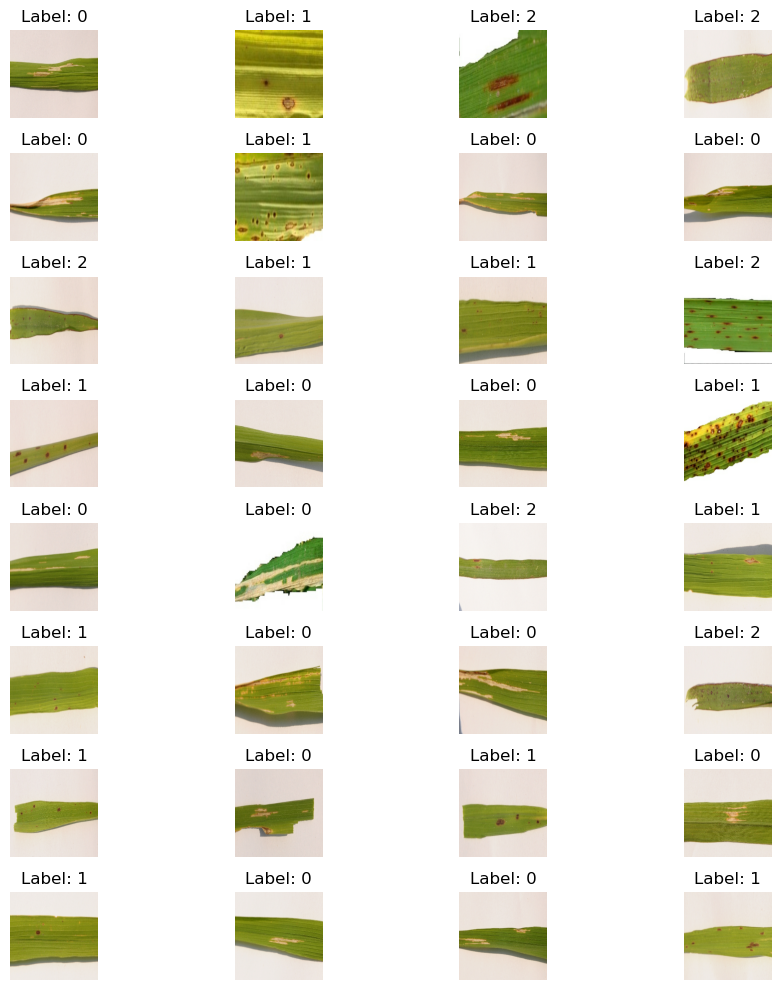

In [7]:
# displaying image batch of 32
batched_ds = data.batch(batch_size)

batch = next(iter(batched_ds))
images, labels = batch

images, labels = next(iter(batched_ds))
show_images(images, labels)

# Data Preprocessing

In [8]:
# creating the empty list
X=[]
y=[]

for image, labels in data.batch(120): # execute loop for all image and labels data
    for img, labels in zip(image, labels): #running loop
        X.append(img) # appending image in X
        y.append(labels.numpy()) # appending labels in y
        

In [9]:
print(image.shape) #shape of image

(120, 224, 224, 3)


# Normalization

In [10]:
# converting to numpy array
X= np.array(X)
y= np.array(y)

In [11]:
# breaking tarining set into training and validation sets manually
(X_train,X_test) = X[0:100],X[100:]
(y_train,y_test) = y[0:100],y[100:]

In [12]:
X_train

array([[[[255.       , 255.       , 255.       ],
         [255.       , 255.       , 255.       ],
         [255.       , 255.       , 255.       ],
         ...,
         [140.49329  , 141.49329  ,  14.493286 ],
         [140.       , 141.       ,  14.       ],
         [139.30136  , 139.60272  ,  14.698639 ]],

        [[255.       , 255.       , 255.       ],
         [255.       , 255.       , 255.       ],
         [255.       , 255.       , 255.       ],
         ...,
         [141.75168  , 142.12668  ,  17.001678 ],
         [141.25     , 141.625    ,  16.5      ],
         [140.988    , 141.10101  ,  17.635288 ]],

        [[255.       , 255.       , 255.       ],
         [255.       , 255.       , 255.       ],
         [255.       , 255.       , 255.       ],
         ...,
         [140.07173  , 140.07173  ,  16.821732 ],
         [138.964    , 138.214    ,  15.339008 ],
         [138.625    , 137.875    ,  16.397278 ]],

        ...,

        [[255.       , 255.       , 25

In [13]:
# reshaping the image size

X_train = X_train.astype('float32')/255.0 if X_train.max() > 1.0 else X_train
X_test = X_test.astype('float32')/255.0 if X_test.max() > 1.0 else X_test

In [14]:
# get the X_train,X_test,y_train,y_test shape

print('shape of X_train_scaled: ',X_train.shape)
print('shape of y_train:',y_train.shape)
print('shape of X_test_scaled: ',X_test.shape)
print('shape of y_test : ',y_test.shape)

shape of X_train_scaled:  (100, 224, 224, 3)
shape of y_train: (100,)
shape of X_test_scaled:  (20, 224, 224, 3)
shape of y_test :  (20,)


# Encoding 

In [15]:
# encoding all image of y_train and y_test
from tensorflow.keras import utils
from tensorflow.keras.utils import to_categorical

y_train = to_categorical(y_train, num_classes = len(class_names))
y_test = to_categorical(y_test, num_classes = len(class_names))

In [16]:
# print number of training and testing and validation images 

print (X_train.shape[0],"train sample")
print (X_test.shape[0],"test sample")

100 train sample
20 test sample


# Create Model

In [17]:
## create CNN Architechture
import warnings
warnings.filterwarnings("ignore")
from keras.models import Sequential
from keras.layers import Conv2D,MaxPooling2D,Flatten,Dense,Dropout

model = Sequential()
model.add(Conv2D(filters=16,kernel_size=(3,3),padding='same',strides=(1),activation='relu',use_bias=False,kernel_initializer='glorot_uniform',bias_initializer='zeros',input_shape=(224,224,3)))
model.add(MaxPooling2D(pool_size=3))
model.add(Conv2D(filters=32,kernel_size=(3,3),padding='same',strides=(1),activation='relu',use_bias=False,kernel_initializer='glorot_uniform',bias_initializer='zeros'))
model.add(MaxPooling2D(pool_size=3))
model.add(Conv2D(filters=64,kernel_size=(3,3),padding='same',strides=(1),activation='relu',use_bias=False,kernel_initializer='glorot_uniform',bias_initializer='zeros'))
model.add(MaxPooling2D(pool_size=3))
model.add(Conv2D(filters=128,kernel_size=(3,3),padding='same',strides=(1),activation='relu',use_bias=False,kernel_initializer='glorot_uniform',bias_initializer='zeros'))
model.add(MaxPooling2D(pool_size=2))
model.add(Conv2D(filters=256,kernel_size=(3,3),padding='same',strides=(1),activation='relu',use_bias=False,kernel_initializer='glorot_uniform',bias_initializer='zeros'))
model.add(MaxPooling2D(pool_size=2))
model.add(Dropout(0.3))
model.add(Flatten())
model.add(Dropout(0.5))
model.add(Dense(250,activation='relu'))
model.add(Dense(100,activation='relu'))
model.add(Dense(3,activation='softmax'))


model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━┓
┃ Layer (type)                  ┃ Output Shape          ┃      Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)               │ (None, 224, 224, 16)  │          432 │
├───────────────────────────────┼───────────────────────┼──────────────┤
│ max_pooling2d (MaxPooling2D)  │ (None, 74, 74, 16)    │            0 │
├───────────────────────────────┼───────────────────────┼──────────────┤
│ conv2d_1 (Conv2D)             │ (None, 74, 74, 32)    │        4,608 │
├───────────────────────────────┼───────────────────────┼──────────────┤
│ max_pooling2d_1               │ (None, 24, 24, 32)    │            0 │
│ (MaxPooling2D)                │                       │              │
├───────────────────────────────┼───────────────────────┼──────────────┤
│ conv2d_2 (Conv2D)             │ (None, 24, 24, 64)    │       18,432 │
├───────────────────────────────┼───────────────────────┼──────────────┤
│ max_pooling2d_2               │ (None, 8, 8, 64)      │            0 │
│ (MaxPooling2D)                │                       │              │
├───────────────────────────────┼───────────────────────┼──────────────┤
│ conv2d_3 (Conv2D)             │ (None, 8, 8, 128)     │       73,728 │
├───────────────────────────────┼───────────────────────┼──────────────┤
│ max_pooling2d_3               │ (None, 4, 4, 128)     │            0 │
│ (MaxPooling2D)                │                       │              │
├───────────────────────────────┼───────────────────────┼──────────────┤
│ conv2d_4 (Conv2D)             │ (None, 4, 4, 256)     │      294,912 │
├───────────────────────────────┼───────────────────────┼──────────────┤
│ max_pooling2d_4               │ (None, 2, 2, 256)     │            0 │
│ (MaxPooling2D)                │                       │              │
├───────────────────────────────┼───────────────────────┼──────────────┤
│ dropout (Dropout)             │ (None, 2, 2, 256)     │            0 │
├───────────────────────────────┼───────────────────────┼──────────────┤
│ flatten (Flatten)             │ (None, 1024)          │            0 │
├───────────────────────────────┼───────────────────────┼──────────────┤
│ dropout_1 (Dropout)           │ (None, 1024)          │            0 │
├───────────────────────────────┼───────────────────────┼──────────────┤
│ dense (Dense)                 │ (None, 250)           │      256,250 │
├───────────────────────────────┼───────────────────────┼──────────────┤
│ dense_1 (Dense)               │ (None, 100)           │       25,100 │
├───────────────────────────────┼───────────────────────┼──────────────┤
│ dense_2 (Dense)               │ (None, 3)             │          303 │
└───────────────────────────────┴───────────────────────┴──────────────┘

 Total params: 673,765 (2.57 MB)

 Trainable params: 673,765 (2.57 MB)

 Non-trainable params: 0 (0.00 B)

## Train the Model

In [18]:
# assigning optimizer, loss and accuracy what we want

model.compile(loss='categorical_crossentropy', optimizer="adam", metrics=['accuracy'])

In [19]:
from keras.callbacks import ModelCheckpoint # we are assigning the checkpoint for save the model with valuation accuracy
checkpointer = ModelCheckpoint(filepath="model.weights.best.keras",save_best_only=False,mode=max,monitor="val_accuracy")

In [20]:
epoch = 57 # assigning epochs and fitting the model with some parameters
history = model.fit(X_train,y_train,batch_size=32,epochs=epoch,validation_data=(X_test,y_test),callbacks=[checkpointer],verbose=1,shuffle=True)

Epoch 1/57
4/4 ━━━━━━━━━━━━━━━━━━━━ 6s 418ms/step - accuracy: 0.3500 - loss: 1.0968 - val_accuracy: 0.2000 - val_loss: 1.2553
Epoch 2/57
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 236ms/step - accuracy: 0.3500 - loss: 1.1404 - val_accuracy: 0.3000 - val_loss: 1.1190
Epoch 3/57
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 231ms/step - accuracy: 0.3200 - loss: 1.1025 - val_accuracy: 0.3000 - val_loss: 1.1159
Epoch 4/57
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 248ms/step - accuracy: 0.3500 - loss: 1.0971 - val_accuracy: 0.3000 - val_loss: 1.0869
Epoch 5/57
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 226ms/step - accuracy: 0.3000 - loss: 1.0993 - val_accuracy: 0.3500 - val_loss: 1.0704
Epoch 6/57
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 230ms/step - accuracy: 0.3400 - loss: 1.0804 - val_accuracy: 0.3000 - val_loss: 1.0923
Epoch 7/57
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 248ms/step - accuracy: 0.4300 - loss: 1.0686 - val_accuracy: 0.3500 - val_loss: 1.0432
Epoch 8/57
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 242ms/step - accuracy: 0.4900 - loss: 1.0459 - val_accuracy: 0.7000 - val_loss:

# Predict the Model

In [21]:
# predicting the model and assigning in variable
y_pred = model.predict(X_test)

leaf_class = ['bacterial leaf blight', 'Brown spot', 'Leaf smut']

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


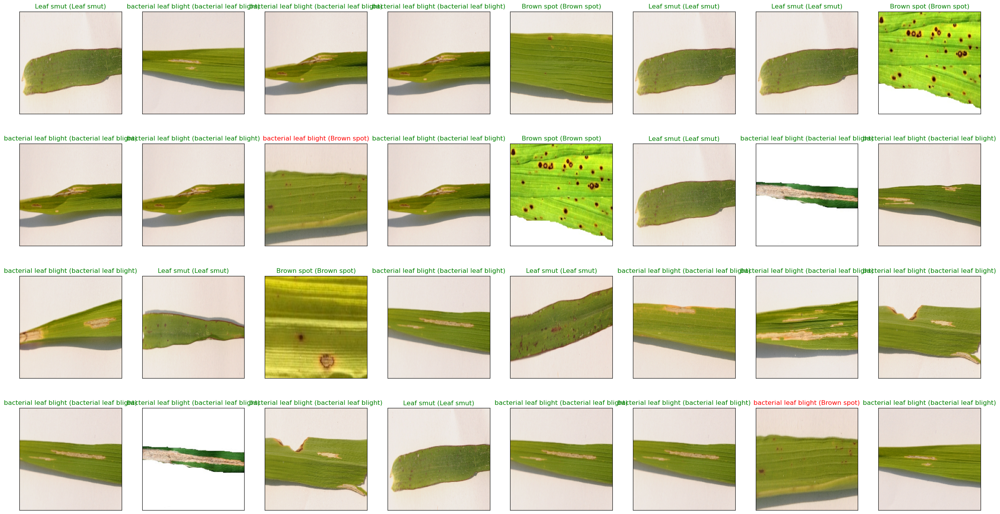

In [22]:
# plot a random sample of test images, their prdicted labels, and ground truth

fig = plt.figure(figsize=(32,17))
for i, idx in enumerate(np.random.choice(X_test.shape[0], size=32, replace=True)):
    ax = fig.add_subplot(4, 8, i + 1, xticks=[], yticks=[])
    ax.imshow(np.squeeze(X_test[idx]))
    pred_idx = np.argmax(y_pred[idx])
    true_idx = np.argmax(y_test[idx])
    ax.set_title("{} ({})".format(leaf_class[pred_idx], leaf_class[true_idx]),
                color=("green" if pred_idx == true_idx else "red"))

### Evaluate test accuracy

In [23]:
scores = model.evaluate(X_test, y_test) # checking the accuracy
accuracys = 100*scores[1]   # saving the accuracy in variable

# print test accuracy 
print('Test Accuracy :%.4f%%' % accuracys)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step - accuracy: 0.9000 - loss: 0.2812
Test Accuracy :90.0000%


In [24]:
accuracys

89.99999761581421

In [25]:
leaf_class[np.argmax(scores)]

'Brown spot'

In [26]:
history.history.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

## Plot Training Loss and Training Accuracy

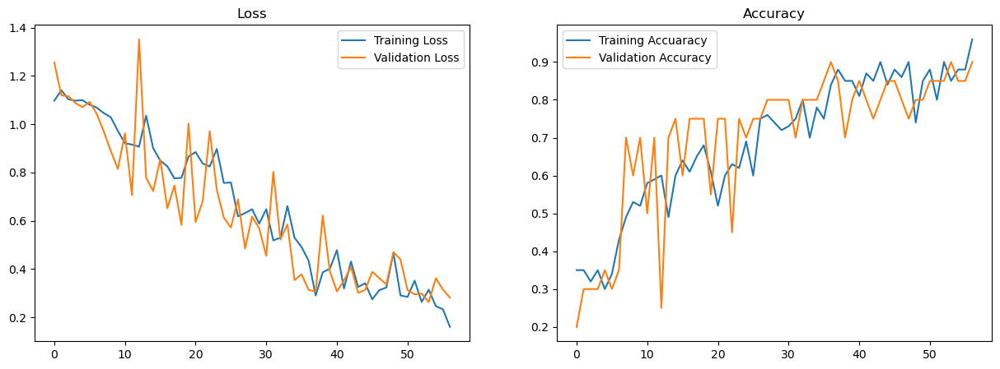

In [27]:
# putting all loss and accuracy in variable for ploting 

loss = history.history["loss"]
val_loss = history.history["val_loss"]
accuracy = history.history["accuracy"]
val_accuracy = history.history["val_accuracy"]


# creating a training loss and validation loss of graph
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.plot(range(epoch), loss, label="Training Loss")
plt.plot(range(epoch), val_loss, label="Validation Loss")
plt.title("Loss")
plt.legend()


# creating a training accuracy and validation accuracy of graph
plt.subplot(1,2,2)
plt.plot(range(epoch), accuracy, label="Training Accuaracy")
plt.plot(range(epoch), val_accuracy, label="Validation Accuracy")
plt.title("Accuracy")
plt.legend()

## Data Augmentation

Data Augmentation is an AI/Machine Learning technique used to artificially increase the size and diversity of a training dataset by creating slightly modified copies of existing data.

When a model is trained on a small dataset, it runs the risk of overfitting—where it memorizes the training data instead of learning general patterns, causing poor performance on new, unseen data. Data augmentation helps the model generalize better by exposing it to different variations and perspectives.

__Common Data Augmentation Techniques:__

- Image Data (Computer Vision):

- Flipping: Flipping images horizontally or vertically.

- Rotation & Zoom: Rotating images at various angles or zooming in/out.

- Cropping: Cutting out specific sections of an image.

- Color Jittering: Adjusting brightness, contrast, or saturation.

__Why is it Important?__

- Reduces Overfitting: Prevents the model from relying on rigid, fixed patterns.

- Improves Model Accuracy: Enables the model to handle diverse real-world conditions smoothly.

- Saves Data Collection Costs: Expands your training dataset without the need to manually collect or label new data.

__Therefore, data augmentation is an important aspect to consider in our project, and we will explore various techniques and approaches to implement it effectively.__



In [28]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator # importing ImageDataGenerator for Data augmentation 

In [29]:
# creating image generator object

datagen = ImageDataGenerator(
    shear_range=0.3,
    zoom_range=0.1,
    width_shift_range=0.1,
    height_shift_range=0.1,
    fill_mode='nearest',
    horizontal_flip=True,
    vertical_flip=True
)
    


In [30]:
# creating CNN Architechture for Data Augmentation

from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout


model_DA = Sequential()
model_DA.add(Conv2D(filters=16,kernel_size=(3,3),padding='same',strides=(1),activation='relu',use_bias=False,kernel_initializer='glorot_uniform',bias_initializer='zeros',input_shape=(224,224,3)))
model_DA.add(MaxPooling2D(pool_size=3))
model_DA.add(Conv2D(filters=32,kernel_size=(3,3),padding='same',strides=(1),activation='relu',use_bias=False,kernel_initializer='glorot_uniform',bias_initializer='zeros'))
model_DA.add(MaxPooling2D(pool_size=3))
model_DA.add(Conv2D(filters=64,kernel_size=(3,3),padding='same',strides=(1),activation='relu',use_bias=False,kernel_initializer='glorot_uniform',bias_initializer='zeros'))
model_DA.add(MaxPooling2D(pool_size=3))
model_DA.add(Conv2D(filters=128,kernel_size=(3,3),padding='same',strides=(1),activation='relu',use_bias=False,kernel_initializer='glorot_uniform',bias_initializer='zeros'))
model_DA.add(MaxPooling2D(pool_size=2))
model_DA.add(Conv2D(filters=256,kernel_size=(3,3),padding='same',strides=(1),activation='relu',use_bias=False,kernel_initializer='glorot_uniform',bias_initializer='zeros'))
model_DA.add(MaxPooling2D(pool_size=2))
model_DA.add(Dropout(0.16))
model_DA.add(Flatten())
model_DA.add(Dropout(0.27))
model_DA.add(Dense(500, activation='relu'))
model_DA.add(Dense(100, activation='relu'))
model_DA.add(Dense(3, activation='softmax'))

model_DA.summary()


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━┓
┃ Layer (type)                  ┃ Output Shape          ┃      Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━┩
│ conv2d_5 (Conv2D)             │ (None, 224, 224, 16)  │          432 │
├───────────────────────────────┼───────────────────────┼──────────────┤
│ max_pooling2d_5               │ (None, 74, 74, 16)    │            0 │
│ (MaxPooling2D)                │                       │              │
├───────────────────────────────┼───────────────────────┼──────────────┤
│ conv2d_6 (Conv2D)             │ (None, 74, 74, 32)    │        4,608 │
├───────────────────────────────┼───────────────────────┼──────────────┤
│ max_pooling2d_6               │ (None, 24, 24, 32)    │            0 │
│ (MaxPooling2D)                │                       │              │
├───────────────────────────────┼───────────────────────┼──────────────┤
│ conv2d_7 (Conv2D)             │ (None, 24, 24, 64)    │       18,432 │
├───────────────────────────────┼───────────────────────┼──────────────┤
│ max_pooling2d_7               │ (None, 8, 8, 64)      │            0 │
│ (MaxPooling2D)                │                       │              │
├───────────────────────────────┼───────────────────────┼──────────────┤
│ conv2d_8 (Conv2D)             │ (None, 8, 8, 128)     │       73,728 │
├───────────────────────────────┼───────────────────────┼──────────────┤
│ max_pooling2d_8               │ (None, 4, 4, 128)     │            0 │
│ (MaxPooling2D)                │                       │              │
├───────────────────────────────┼───────────────────────┼──────────────┤
│ conv2d_9 (Conv2D)             │ (None, 4, 4, 256)     │      294,912 │
├───────────────────────────────┼───────────────────────┼──────────────┤
│ max_pooling2d_9               │ (None, 2, 2, 256)     │            0 │
│ (MaxPooling2D)                │                       │              │
├───────────────────────────────┼───────────────────────┼──────────────┤
│ dropout_2 (Dropout)           │ (None, 2, 2, 256)     │            0 │
├───────────────────────────────┼───────────────────────┼──────────────┤
│ flatten_1 (Flatten)           │ (None, 1024)          │            0 │
├───────────────────────────────┼───────────────────────┼──────────────┤
│ dropout_3 (Dropout)           │ (None, 1024)          │            0 │
├───────────────────────────────┼───────────────────────┼──────────────┤
│ dense_3 (Dense)               │ (None, 500)           │      512,500 │
├───────────────────────────────┼───────────────────────┼──────────────┤
│ dense_4 (Dense)               │ (None, 100)           │       50,100 │
├───────────────────────────────┼───────────────────────┼──────────────┤
│ dense_5 (Dense)               │ (None, 3)             │          303 │
└───────────────────────────────┴───────────────────────┴──────────────┘

 Total params: 955,015 (3.64 MB)

 Trainable params: 955,015 (3.64 MB)

 Non-trainable params: 0 (0.00 B)

In [31]:
# assigning optimizer, loss and accuracy what we want 
model_DA.compile(loss='categorical_crossentropy', optimizer="adam", metrics=['accuracy'])

In [32]:
# Training model with Data Augmentation
epoch_DA = 57

checkpointer_own_aug = ModelCheckpoint(filepath='own_model_aug.weights.best.keras', verbose=1, monitor="val_accuracy") 

aug_history = model_DA.fit(
    datagen.flow(X_train, y_train, batch_size=32),
    validation_data=(X_test, y_test),
    steps_per_epoch=len(X_train)//batch_size,
    epochs=epoch_DA,
    shuffle=True,
    callbacks=[checkpointer_own_aug]
)

Epoch 1/57
2/3 ━━━━━━━━━━━━━━━━━━━━ 0s 697ms/step - accuracy: 0.3281 - loss: 1.1310
Epoch 1: saving model to own_model_aug.weights.best.keras

Epoch 1: finished saving model to own_model_aug.weights.best.keras
3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 752ms/step - accuracy: 0.3529 - loss: 1.1253 - val_accuracy: 0.3000 - val_loss: 1.1344
Epoch 2/57
1/3 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - accuracy: 0.2188 - loss: 1.1378
Epoch 2: saving model to own_model_aug.weights.best.keras

Epoch 2: finished saving model to own_model_aug.weights.best.keras
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step - accuracy: 0.2188 - loss: 1.1378 - val_accuracy: 0.3000 - val_loss: 1.1270
Epoch 3/57
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step - accuracy: 0.3529 - loss: 1.1188
Epoch 3: saving model to own_model_aug.weights.best.keras

Epoch 3: finished saving model to own_model_aug.weights.best.keras
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 566ms/step - accuracy: 0.3529 - loss: 1.1188 - val_accuracy: 0.3000 - val_loss: 1.1532
Epoch 4/57
1/3 ━━━━━━━━━━

In [33]:
y_pred_DA = model_DA.predict(X_test) # predicting

# define text labels (https://www.cs.toronto.edu/~kriz/cifar.html)
leaf_class = ['Bacterial leaf blight', 'Brown spot', 'Leaf smut']

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step


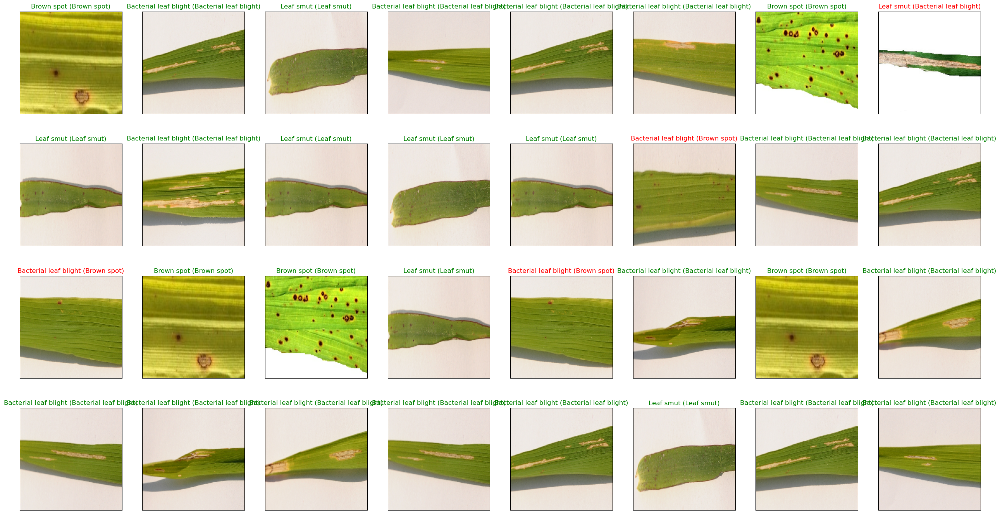

In [34]:
fig = plt.figure(figsize=(32, 17))
for i, idx in enumerate(np.random.choice(X_test.shape[0], size=32, replace=True)):
    ax = fig.add_subplot(4, 8, i + 1, xticks=[], yticks=[])
    ax.imshow(np.squeeze(X_test[idx]))
    pred_idx = np.argmax(y_pred_DA[idx])
    true_idx = np.argmax(y_test[idx])
    ax.set_title("{} ({})".format(leaf_class[pred_idx], leaf_class[true_idx]),
                 color=("green" if pred_idx == true_idx else "red"))

In [35]:
score_DA = model_DA.evaluate(X_test, y_test) # predicting the model
accuracy_DA = 100*score_DA[1] # saving the accuracy in variable

# print test accuracy
print('Test accuracy: %.4f%%' % accuracy_DA)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - accuracy: 0.7000 - loss: 1.0275
Test accuracy: 70.0000%


In [36]:
# define plot for ploting graph of model_name, acc, val_acc, loss, val_loss

def plot_performance(model_name, acc, val_acc, loss, val_loss):
  plt.figure(figsize=(10,5))
  plt.subplot(1,2,1)
  plt.plot(loss)
  plt.plot(val_loss)
  plt.title('{} : Loss'.format(model_name), fontsize=12, fontweight='bold')
  plt.ylabel('Loss')
  plt.xlabel('Epoch')
  plt.legend(['train', 'test'], loc='upper right')

  plt.subplot(1,2,2)
  plt.plot(acc)
  plt.plot(val_acc)
  plt.title('{} : Accuracy'.format(model_name), fontsize=12, fontweight='bold')
  plt.ylabel('Accuracy')
  plt.xlabel('Epoch')
  plt.legend(['train', 'test'], loc='upper right')

  plt.tight_layout()

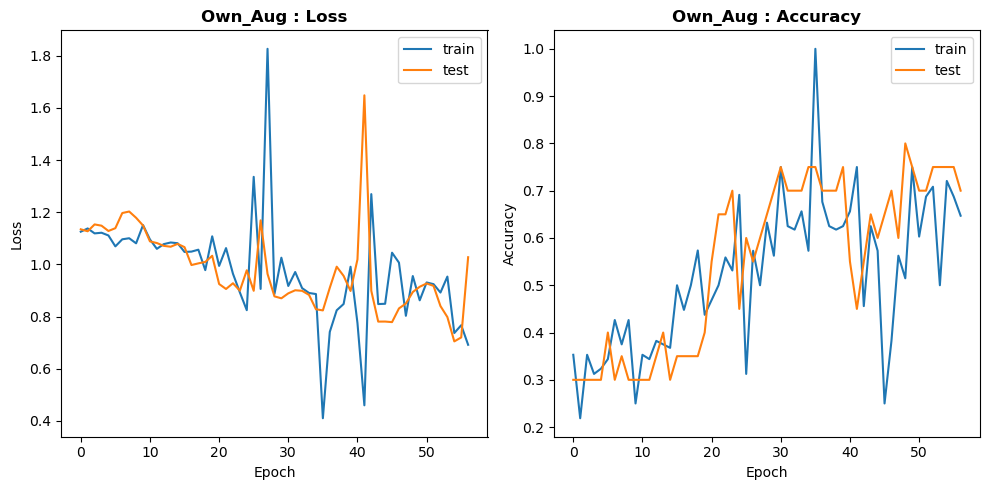

In [37]:
#visualising model performance
plot_performance(model_name='Own_Aug',
                  acc=aug_history.history['accuracy'], 
                 val_acc=aug_history.history['val_accuracy'],
                 loss=aug_history.history['loss'], 
                 val_loss=aug_history.history['val_loss'])

## Keras Tuner

Keras Tuner is a hyperparameter tuning library for Keras, which allows users to search for the best hyperparameters in an automated way. Hyperparameter tuning is a crucial step in building machine learning models, and it involves finding the best set of hyperparameters for a given model architecture and dataset. The optimal hyperparameters can help to achieve better performance in terms of accuracy, speed, and generalization ability of the model.

In this project, Keras Tuner has been used to search for the optimal hyperparameters of the convolutional neural network model, which includes the number of convolutional layers, the number of filters in each layer, the kernel size, the activation function, and the learning rate of the optimizer. The goal is to find the best combination of hyperparameters that can improve the accuracy of the model on the test dataset.

At the end, we will analyse whether the model performance improves or not.

In [38]:
!pip install keras-tuner
!pip install tensorboard

In [39]:
import kerastuner # importing keras tuner for hyperparameters
from kerastuner import RandomSearch # importing randomsearch for cross validation
from kerastuner.engine.hyperparameters import HyperParameters # assigning HyperParameters of keras

In [40]:
# define CNN model architecture with various parameters

def build_model(hp):
    new_model=Sequential()

    #adding first convolutional layer
    new_model.add(Conv2D(
        filters=hp.Int('conv_1_filter', min_value=8,max_value=32, step=8),
        kernel_size=hp.Choice('conv_1_kernel', values=[2,3]),
        padding=hp.Choice('conv_1_pad', values=['same','valid']),
        activation='relu',input_shape=input_shape_3D))
    new_model.add(MaxPooling2D())


    #adding second convloutional layer
    new_model.add(Conv2D(
        filters= hp.Int('conv_2_filter', min_value=16, max_value=64, step=16),
        kernel_size=hp.Choice('conv_2_kernel', values= [2,3]),
        padding=hp.Choice('conv_2_pad', values=['same', 'valid']),
        activation='relu'))
    new_model.add(MaxPooling2D())


    # adding third convloutional layer
    new_model.add(Conv2D(
      filters= hp.Int('conv_3_filter', min_value=32, max_value=128, step=32),
      kernel_size=hp.Choice('conv_3_kernel', values= [2,3]),
      padding=hp.Choice('conv_3_pad', values=['same', 'valid']),
      activation='relu'))
    new_model.add(MaxPooling2D())

    # adding flatten layer
    new_model.add(Flatten())

  # adding fully connected layers
    new_model.add(Dense(
      units=hp.Int('dense_1_units', min_value=50, max_value=250, step=50),
      activation='relu'))

  #adding output layer : number of classes are 3
    new_model.add(Dense(3, activation='softmax'))
    
    new_model.compile(
      optimizer=keras.optimizers.Adam(hp.Choice('learning_rate', values=[1e-1, 1e-2, 1e-3])),
      loss='categorical_crossentropy',
      metrics=['accuracy'])

    return new_model


    

In [41]:
# we will run random search on the model with an objective to optimum accuracy on the test data
tuner_search = RandomSearch(build_model, objective='val_accuracy', max_trials=3, directory='output', project_name='RiceLeafDisease')


Reloading Tuner from output\RiceLeafDisease\tuner0.json


In [42]:
# searching random tuner 

tuner_search.search(
    datagen.flow(X_train,y_train),
    validation_data=(X_test,y_test),
    epochs=10
)

In [43]:
# searching best models with best parameters

tuned_model=tuner_search.get_best_models(num_models=1)[0]

In [44]:
tuned_model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━┓
┃ Layer (type)                  ┃ Output Shape          ┃      Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)               │ (None, 223, 223, 16)  │          208 │
├───────────────────────────────┼───────────────────────┼──────────────┤
│ max_pooling2d (MaxPooling2D)  │ (None, 111, 111, 16)  │            0 │
├───────────────────────────────┼───────────────────────┼──────────────┤
│ conv2d_1 (Conv2D)             │ (None, 111, 111, 48)  │        6,960 │
├───────────────────────────────┼───────────────────────┼──────────────┤
│ max_pooling2d_1               │ (None, 55, 55, 48)    │            0 │
│ (MaxPooling2D)                │                       │              │
├───────────────────────────────┼───────────────────────┼──────────────┤
│ conv2d_2 (Conv2D)             │ (None, 53, 53, 32)    │       13,856 │
├───────────────────────────────┼───────────────────────┼──────────────┤
│ max_pooling2d_2               │ (None, 26, 26, 32)    │            0 │
│ (MaxPooling2D)                │                       │              │
├───────────────────────────────┼───────────────────────┼──────────────┤
│ flatten (Flatten)             │ (None, 21632)         │            0 │
├───────────────────────────────┼───────────────────────┼──────────────┤
│ dense (Dense)                 │ (None, 250)           │    5,408,250 │
├───────────────────────────────┼───────────────────────┼──────────────┤
│ dense_1 (Dense)               │ (None, 3)             │          753 │
└───────────────────────────────┴───────────────────────┴──────────────┘

 Total params: 5,430,027 (20.71 MB)

 Trainable params: 5,430,027 (20.71 MB)

 Non-trainable params: 0 (0.00 B)

In [45]:
#training model
checkpointer_own_tuned = ModelCheckpoint(filepath='own_model_tuned.weights.best.keras', verbose=3, save_best_only=True)

tuned_history= tuned_model.fit(
    datagen.flow(X_train, y_train, batch_size=batch_size),
    validation_data=(X_test, y_test),
    steps_per_epoch=len(X_train)//batch_size, 
    initial_epoch=10,
    epochs=epochs,
    callbacks=[checkpointer_own_tuned]
)

Epoch 11/30
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step - accuracy: 0.4559 - loss: 300.0751
Epoch 11: val_loss improved from None to 1.80857, saving model to own_model_tuned.weights.best.keras

Epoch 11: finished saving model to own_model_tuned.weights.best.keras
3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 980ms/step - accuracy: 0.4559 - loss: 300.0751 - val_accuracy: 0.3000 - val_loss: 1.8086
Epoch 12/30
1/3 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step - accuracy: 0.3438 - loss: 1.4542
Epoch 12: val_loss improved from 1.80857 to 1.37977, saving model to own_model_tuned.weights.best.keras

Epoch 12: finished saving model to own_model_tuned.weights.best.keras
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 275ms/step - accuracy: 0.3438 - loss: 1.4542 - val_accuracy: 0.3000 - val_loss: 1.3798
Epoch 13/30
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 529ms/step - accuracy: 0.2500 - loss: 1.4238
Epoch 13: val_loss improved from 1.37977 to 1.04066, saving model to own_model_tuned.weights.best.keras

Epoch 13: finished saving model to own_model_tuned.weights.

In [46]:
y_pred_DA_tuned = tuned_model.predict(X_test) # predicting 

# define text labels (source: https://www.cs.toronto.edu/~kriz/cifar.html)
leaf_class = ['Bacterial leaf blight', 'Brown spot', 'Leaf smut']

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


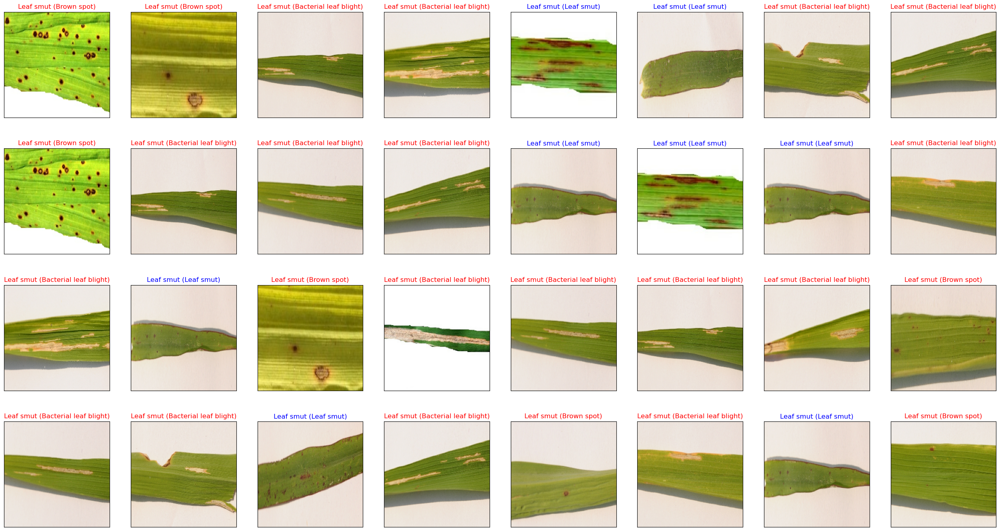

In [47]:
# plot a random sample of test images, their predicted labels, and ground truth
fig = plt.figure(figsize=(32, 17))
for i, idx in enumerate(np.random.choice(X_test.shape[0], size=32, replace=True)):
    ax = fig.add_subplot(4, 8, i + 1, xticks=[], yticks=[])
    ax.imshow(np.squeeze(X_test[idx]))
    pred_idx = np.argmax(y_pred_DA_tuned[idx])
    true_idx = np.argmax(y_test[idx])
    ax.set_title("{} ({})".format(leaf_class[pred_idx], leaf_class[true_idx]),
                 color=("blue" if pred_idx == true_idx else "red"))

In [48]:
score_tuned = tuned_model.evaluate(X_test,y_test) # prdicting the model
accuracy_tuned = 100*score_tuned[1] # saving the accuracy in variable

# print test accuracy
print('Test accuracy: %.4f%%' %accuracy_tuned)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step - accuracy: 0.2000 - loss: 1.3043
Test accuracy: 20.0000%


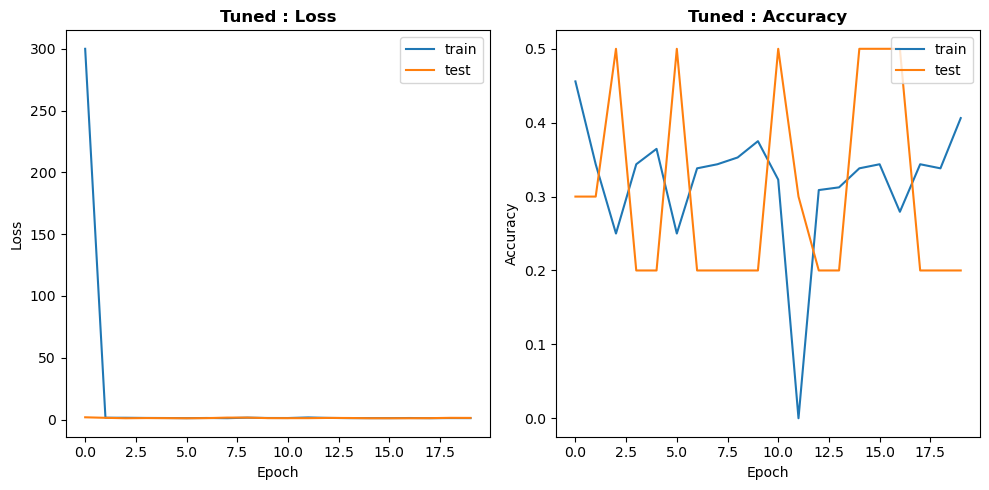

In [49]:
# ploting val,val_loss,val_acc for visulaization

plot_performance(model_name='Tuned',
                acc=tuned_history.history['accuracy'],
                val_acc=tuned_history.history['val_accuracy'],
                loss=tuned_history.history['loss'],
                val_loss=tuned_history.history['val_loss'])

In [50]:
# creating dataframe for model camparison
score = pd.DataFrame({"Model":["Normal CNN","Data Augmentation","CNN with hyperparameter"],
                     "accuracy":[accuracys,accuracy_DA,accuracy_tuned]
                     })

In [51]:
score

,Model,accuracy
0,Normal CNN,89.999998
1,Data Augmentation,69.999999
2,CNN with hyperparameter,20.000000


# Model Comparison Report

Overall, The project was successful in building a deep learning model to classify images of rice leaf diseases. We explored the dataset, preprocessed the data, built and trained deep learning models, and evaluated their performance. Finally, we selected __Normal CNN model__ as the best model and achieved good accuracy on new images which is __90%__ and it's a generalizes model.

# Data Analysis Report

The project is a deep learning model to classify images of rice leaf disease. The dataset contained images from 3 type of rice leaf disease which are bacterial bligh, brown spot, and leaf smut. The project was divided into several steps, including data exploration, data preprocessing, building and training deep learning models, and evaluating model performance.

During data exploration, we analyzed the dataset and visualized the images to get a better understanding of the data. We observed that the dataset was balanced, with an equal number of images for rice leaf diseases. We also noticed that the images were of different sizes and needed to be resized to a uniform size before being used for training. We have rescaled them to uniform size of 224 X 224.

For data preprocessing, We have normalized the training dataset and also encoded the labels. We used Keras' ImageDataGenerator to generate augmented images to increase the size of the dataset and reduce overfitting. We also resized the images and divided them into training, validation, and testing sets.

We built deep learning models by applying CNN model,Data AUgmentation and hyperparameters. We trained these models on the original and augmented datasets and evaluated their performance using accuracy, loss, and time taken per epoch. We also plotted the training and validation curves to analyze the models' behavior during training.

# Report on Challanges Faced 

- Limited amount of data: One of the biggest challenges in the project was the limited amount of data available for training the models. We had only 119 images from 3 classes. This could lead to overfitting, where the model memorizes the training data and does not generalize well to new data. To deal with this challenge, data augmentation techniques were used to artificially increase the size of the dataset. This helped to improve the performance of the models and reduce overfitting.

- Complexity of deep learning models: Deep learning models can be very complex and have a large number of parameters, which makes them difficult to train and optimize.

- Choosing the best model: With multiple models to choose from, it can be difficult to determine which one is the best for the task at hand. To deal with this challenge, various metrics such as accuracy, loss, and training time were used to evaluate the performance of the models. Based on these metrics, the normal CNN model was selected as the best model for the task.

##                               _____Done_____